In [1]:
# Importing necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import pingouin
from scipy.stats import chi2_contingency

In [2]:
data= pd.read_csv("cleaned_data.csv")

In [3]:
data['Total curricular units (credited)'] = data['Curricular units 1st sem (credited)'] + data['Curricular units 2nd sem (credited)']
data['Total curricular units (enrolled)'] = data['Curricular units 1st sem (enrolled)']	+ data['Curricular units 2nd sem (enrolled)']
data['Total curricular units (evaluations)'] = data['Curricular units 1st sem (evaluations)']	+ data['Curricular units 2nd sem (evaluations)']
data['Total curricular units (approved)'] = data['Curricular units 1st sem (approved)']	+ data['Curricular units 2nd sem (approved)']
data['Average curricular units grade'] = (data['Curricular units 1st sem (grade)'] + data['Curricular units 2nd sem (grade)'])/2
data['Total curricular units (without evaluations)'] = data['Curricular units 1st sem (without evaluations)'] + data['Curricular units 2nd sem (without evaluations)']

In [4]:
# numeric = ['Age at enrollment','Average curricular units grade', 'Unemployment rate','Inflation rate','GDP','Previous qualification (grade)','Admission grade','Curricular units 1st sem (grade)','Curricular units 2nd sem (grade)']
category =  ['Daytime/evening attendance','Displaced','Educational special needs','Debtor','Tuition fees up to date','Gender','Scholarship holder','International','Marital status','Target','Previous qualification','Nationality','Course','Curricular units 1st sem (credited)','Curricular units 1st sem (enrolled)','Curricular units 1st sem (evaluations)','Curricular units 1st sem (approved)','Curricular units 1st sem (without evaluations)','Curricular units 2nd sem (credited)','Curricular units 2nd sem (enrolled)','Curricular units 2nd sem (evaluations)','Curricular units 2nd sem (approved)','Curricular units 2nd sem (without evaluations)']
for cat in category:
    data[f'{cat}'] = data[f'{cat}'].astype(str)

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4424 entries, 0 to 4423
Data columns (total 72 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   Marital status                                          4424 non-null   object 
 1   Application mode                                        4424 non-null   int64  
 2   Application order                                       4424 non-null   int64  
 3   Course                                                  4424 non-null   object 
 4   Daytime/evening attendance                              4424 non-null   object 
 5   Previous qualification                                  4424 non-null   object 
 6   Previous qualification (grade)                          4424 non-null   float64
 7   Nationality                                             4424 non-null   object 
 8   Mother's qualification                

# Univariate Analysis

#  histograms and box plots for numerical variables

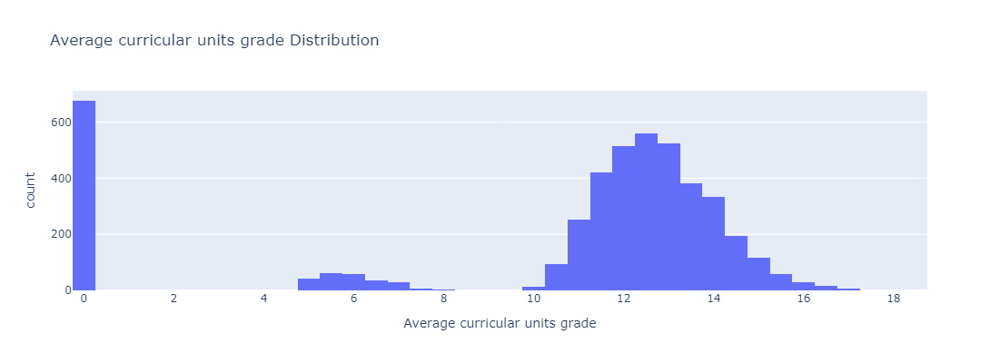

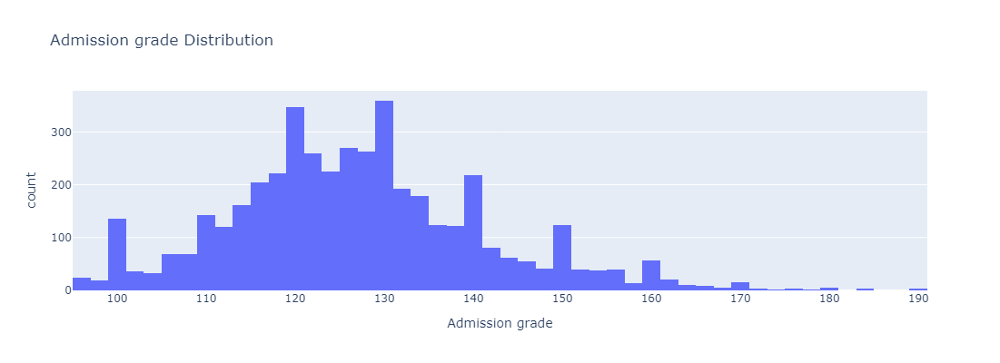

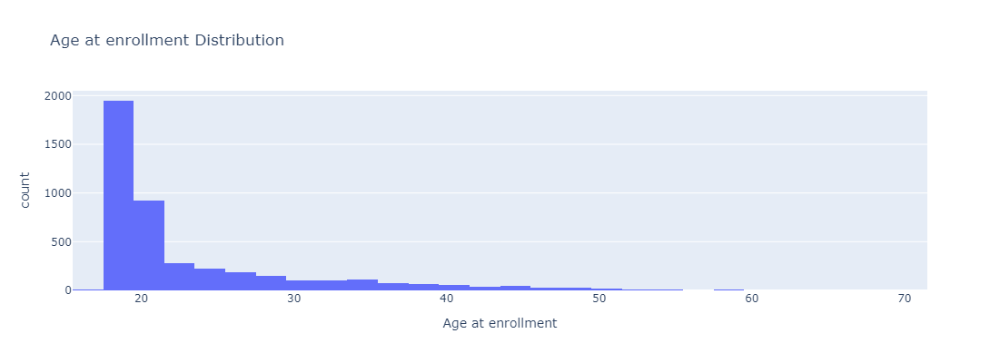

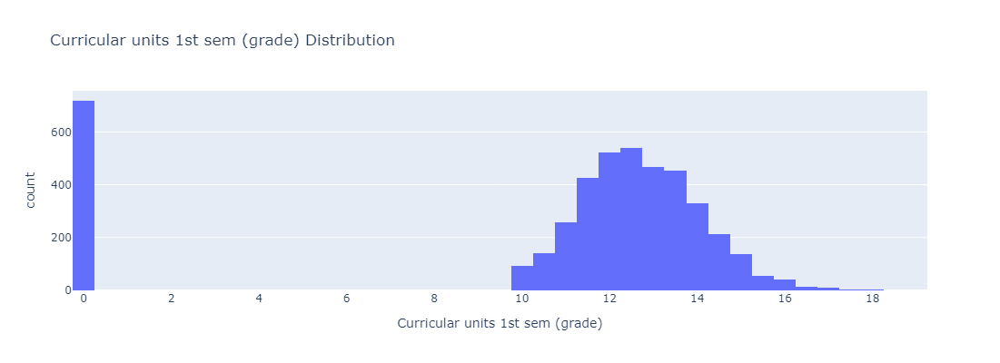

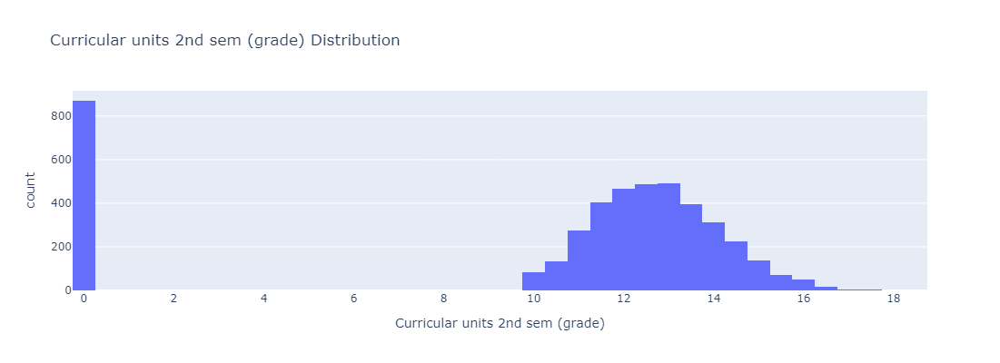

In [8]:
numeric = ['Average curricular units grade', 'Admission grade','Age at enrollment','Curricular units 1st sem (grade)','Curricular units 2nd sem (grade)']
for num in numeric:
    fig = px.histogram(data, x=num, title= f"{num} Distribution",  nbins=50,
  width=600,
  height=400,)
    fig.show()

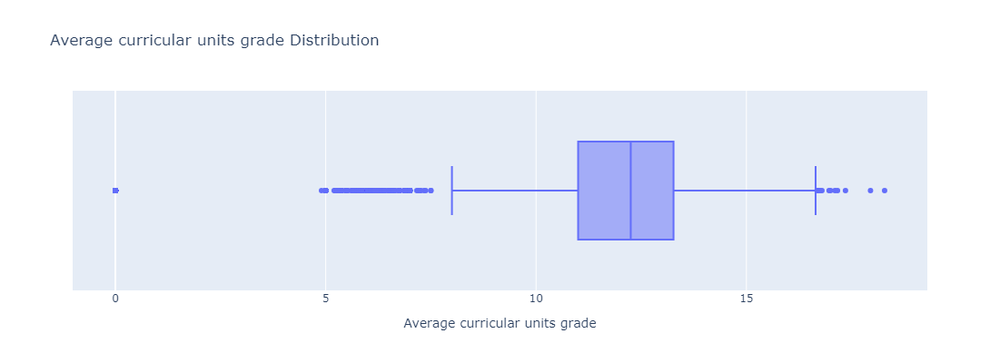

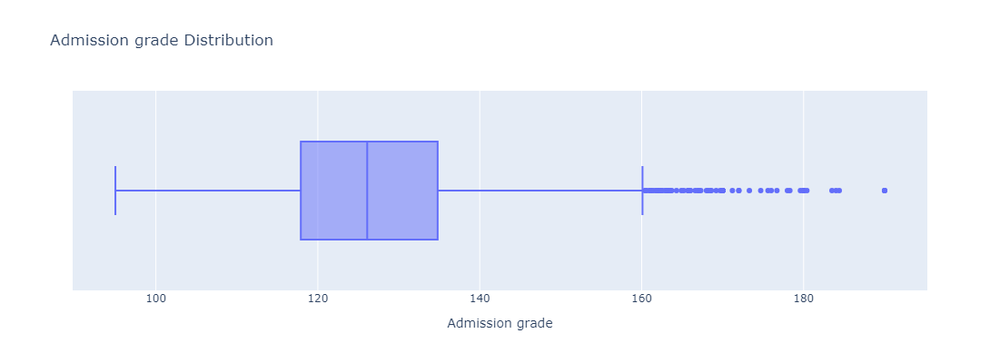

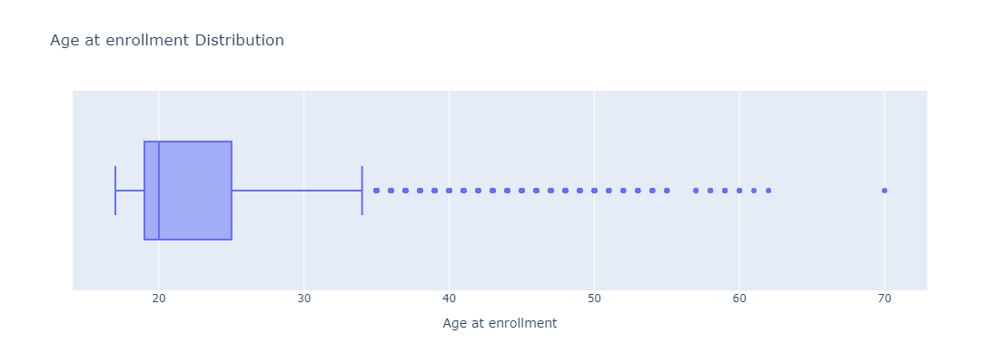

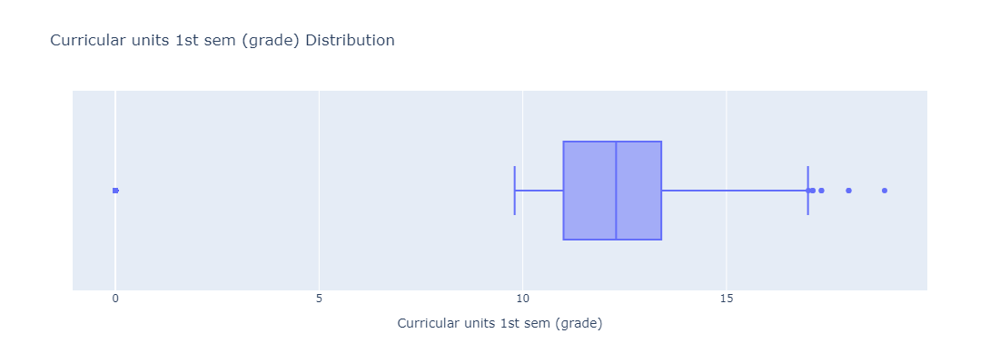

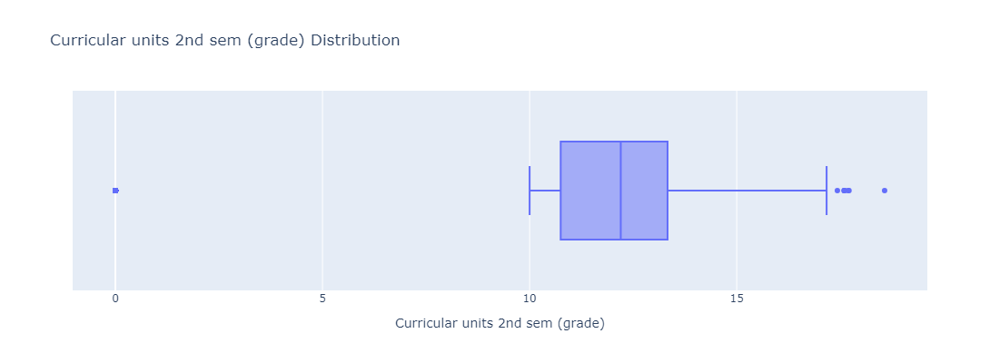

In [9]:
for num in numeric:
    fig = px.box(data, x=num, title= f"{num} Distribution", 
  width=600,
  height=400,)
    fig.show()

In [10]:
data.describe()

,Application mode,Application order,Previous qualification (grade),Mother's qualification,Father's qualification,Mother's occupation,Father's occupation,Admission grade,Age at enrollment,Curricular units 1st sem (grade),...,Inflation rate_encoded,GDP_encoded,Curricular units 1st sem (grade)_encoded,Curricular units 2nd sem (grade)_encoded,Total curricular units (credited),Total curricular units (enrolled),Total curricular units (evaluations),Total curricular units (approved),Average curricular units grade,Total curricular units (without evaluations)
count,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,...,4.424000e+03,4.424000e+03,4.424000e+03,4.424000e+03,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000
mean,18.669078,1.727396,132.613314,19.561935,22.275316,10.960895,11.032324,126.978119,23.265145,10.640848,...,1.525804e-16,2.650080e-17,-1.413376e-16,-1.718537e-16,1.251808,12.502712,16.362342,9.142405,10.435524,0.287975
std,17.484682,1.311632,13.188332,15.603186,15.343108,26.418253,25.263040,14.482001,7.587816,4.843666,...,1.000113e+00,1.000113e+00,1.000113e+00,1.000113e+00,4.220239,4.608821,7.664986,5.960612,4.818540,1.285682
min,1.000000,0.000000,95.000000,1.000000,1.000000,0.000000,0.000000,95.000000,17.000000,0.000000,...,-1.466871e+00,-1.789667e+00,-2.197107e+00,-1.963484e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,125.000000,2.000000,3.000000,4.000000,4.000000,117.900000,19.000000,11.000000,...,-6.712423e-01,-7.498721e-01,7.415725e-02,9.976505e-02,0.000000,10.000000,13.000000,5.000000,11.000000,0.000000
50%,17.000000,1.000000,133.100000,19.000000,19.000000,5.000000,7.000000,126.100000,20.000000,12.290000,...,1.243865e-01,1.401217e-01,3.405145e-01,3.780637e-01,0.000000,12.000000,16.000000,10.000000,12.250000,0.000000
75%,39.000000,2.000000,140.000000,37.000000,37.000000,9.000000,9.000000,134.800000,25.000000,13.400000,...,9.923451e-01,7.877904e-01,5.697057e-01,5.949447e-01,0.000000,14.000000,20.000000,12.000000,13.266250,0.000000
max,57.000000,7.000000,190.000000,44.000000,44.000000,194.000000,195.000000,190.000000,70.000000,18.880000,...,1.787974e+00,1.545607e+00,1.701208e+00,1.600659e+00,39.000000,46.000000,72.000000,43.000000,18.285000,24.000000


In [11]:
data.describe(include='object')

,Marital status,Course,Daytime/evening attendance,Previous qualification,Nationality,Displaced,Educational special needs,Debtor,Tuition fees up to date,Gender,...,Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (without evaluations),Target
count,4424,4424,4424,4424,4424,4424,4424,4424,4424,4424,...,4424,4424,4424,4424,4424,4424,4424,4424,4424,4424
unique,6,17,2,17,21,2,2,2,2,2,...,23,35,23,11,19,22,30,20,10,3
top,1,9500,1,1,1,1,0,0,1,0,...,6,8,6,0,0,6,8,6,0,Graduate
freq,3919,766,3941,3717,4314,2426,4373,3921,3896,2868,...,1910,791,1171,4130,3894,1913,792,965,4142,2209


# Bar Chart for Categorical Variables

In [13]:
for cat in category:
    sort = data[f'{cat}'].sort_values()
    sort

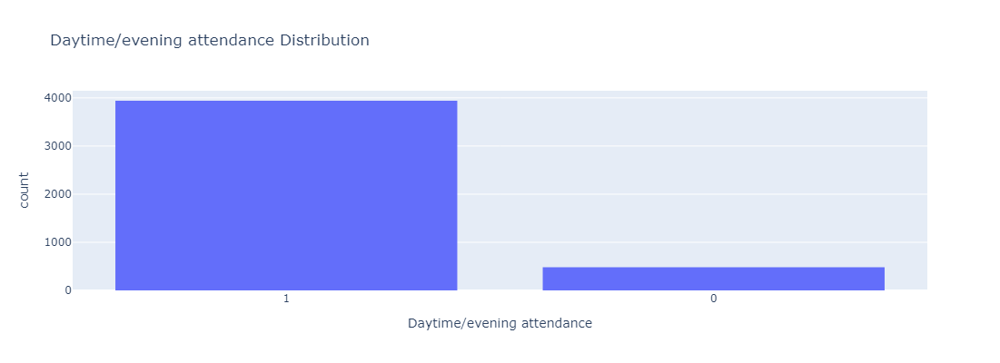

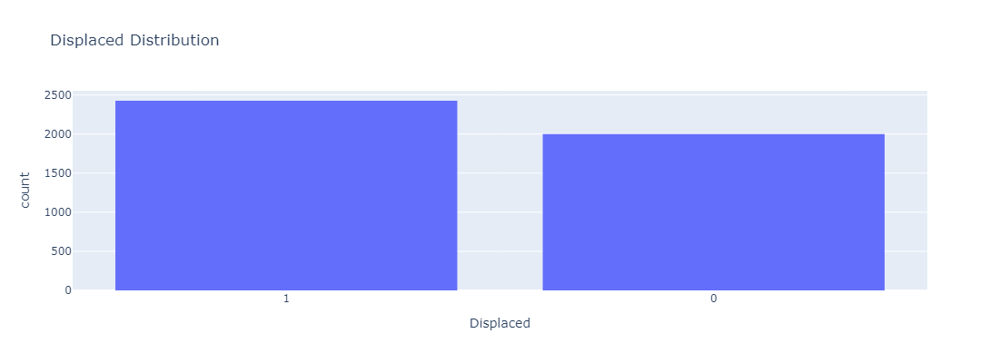

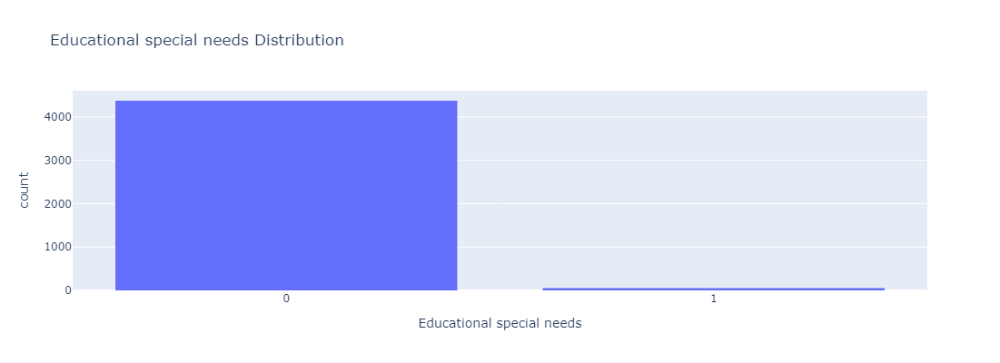

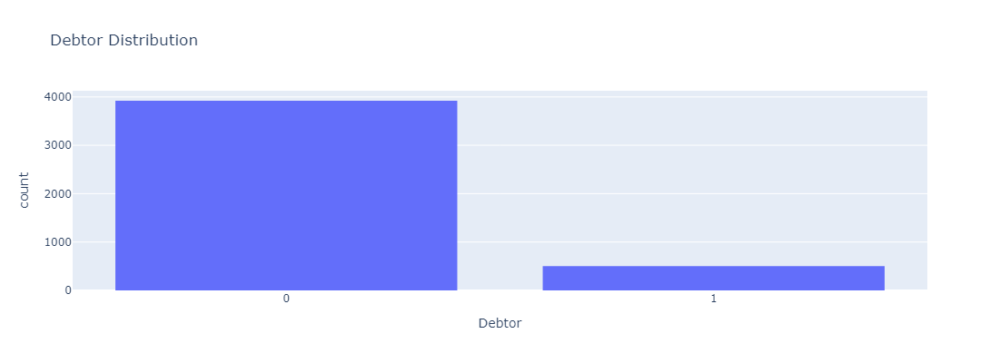

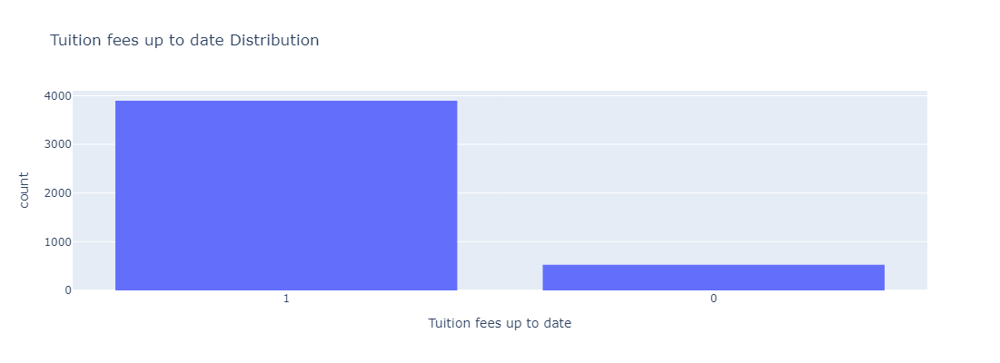

...

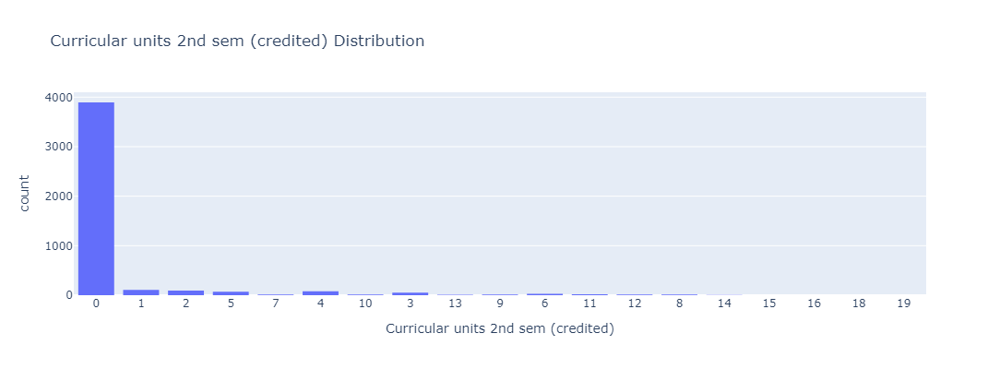

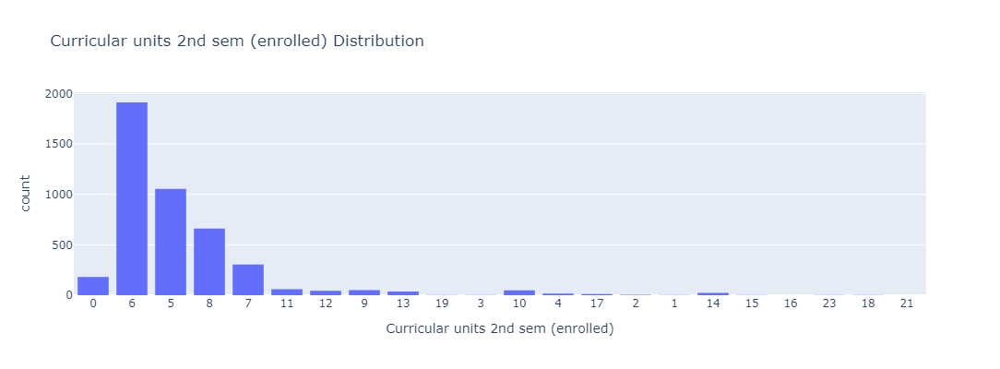

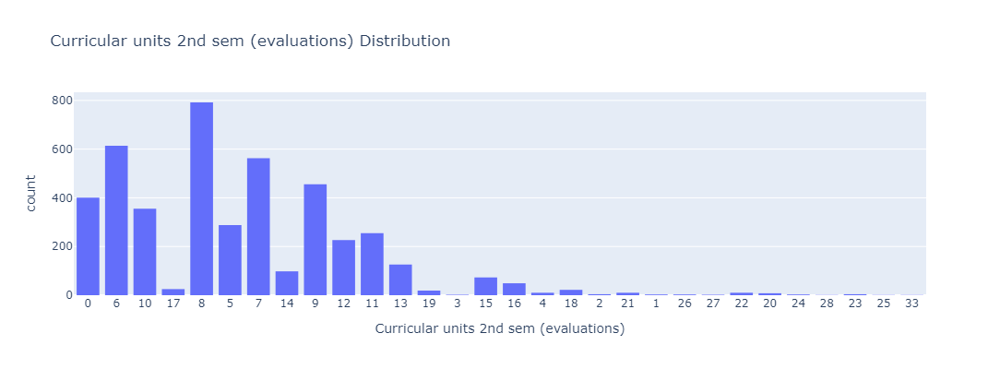

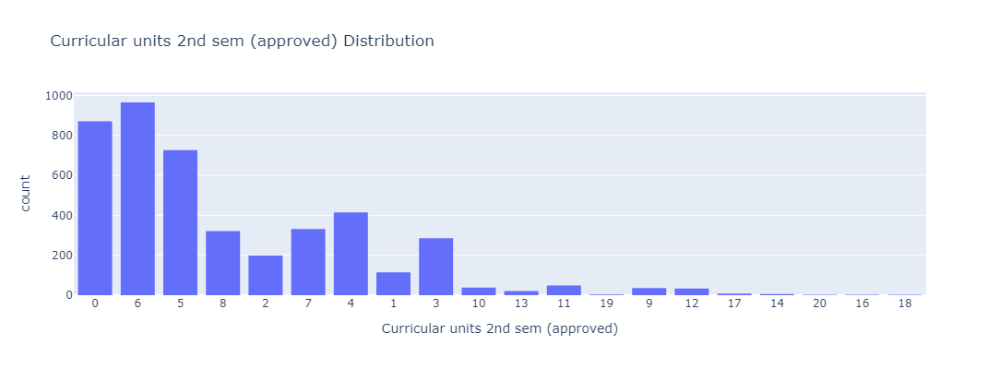

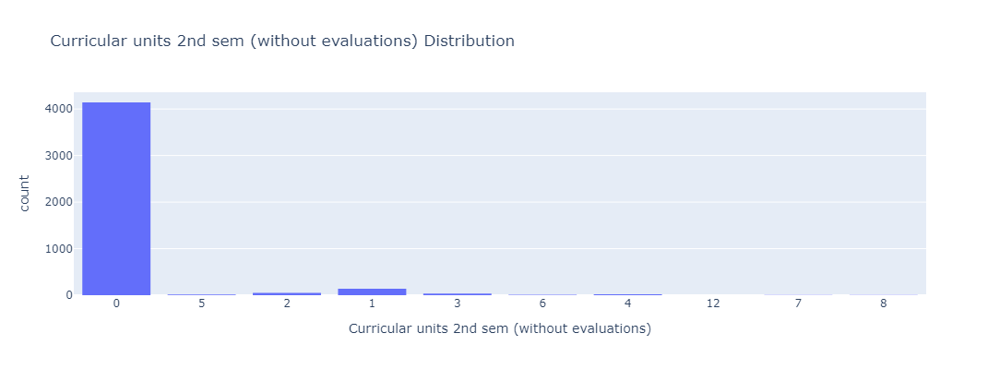

In [14]:
ap  = []
for i in range(10000):
    ap.append(i)

for cat in category:
    fig = px.histogram(data, x=cat, title= f"{cat} Distribution", category_orders=ap,
                       width=600,
                       height=400,)
    fig.show()

In [15]:
data[['Average curricular units grade', 'Age at enrollment']].var()

Average curricular units grade    23.218327
Age at enrollment                 57.574946
dtype: float64

# Bivariate Analysis

## Scatter plots for pairs of numerical variables

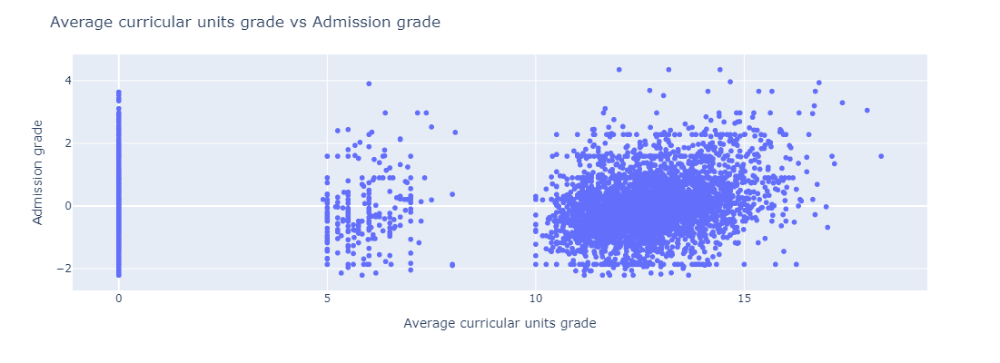

In [18]:
# 'Average curricular units grade', 'Admission grade','Age at enrollment','Curricular units 1st sem (grade)','Curricular units 2nd sem (grade)'
fig = px.scatter(data, x='Average curricular units grade', y='Admission grade_encoded',  width=600,
  height=400,)
fig.update_layout(
        title= "Average curricular units grade vs Admission grade",
        xaxis_title= 'Average curricular units grade',
        yaxis_title= "Admission grade")
fig.show()

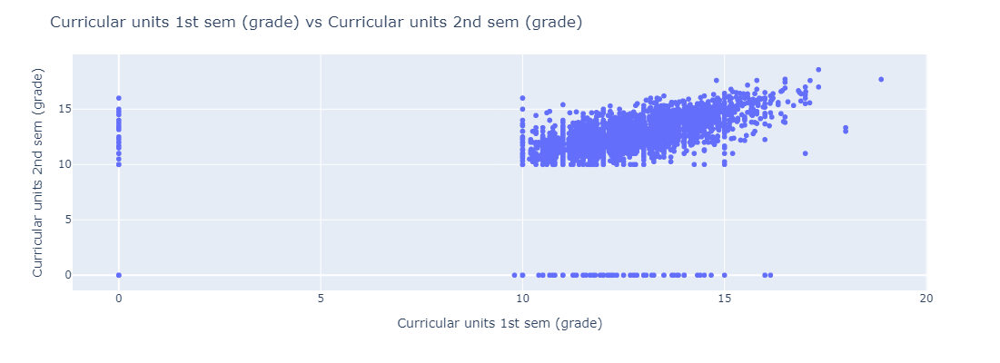

In [19]:
fig = px.scatter(data, x='Curricular units 1st sem (grade)',y='Curricular units 2nd sem (grade)',  width=600,
  height=400,)
fig.update_layout(
        title= 'Curricular units 1st sem (grade) vs Curricular units 2nd sem (grade)',
        xaxis_title= 'Curricular units 1st sem (grade)',
        yaxis_title= "Curricular units 2nd sem (grade)")
fig.show()

## Box plots of numerical variables grouped by categorical variables

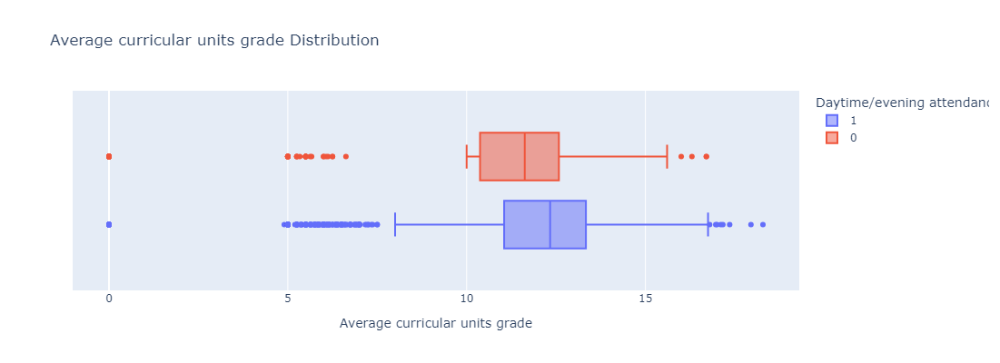

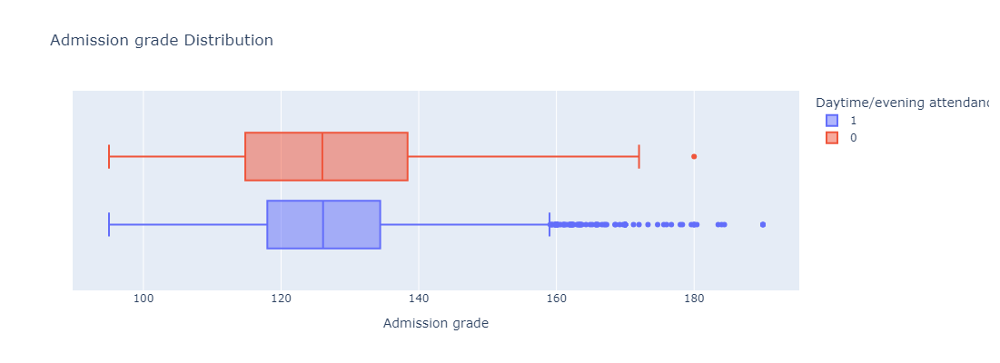

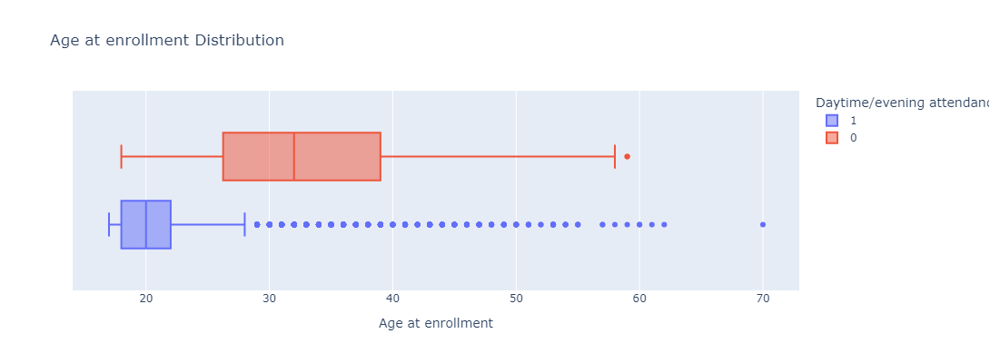

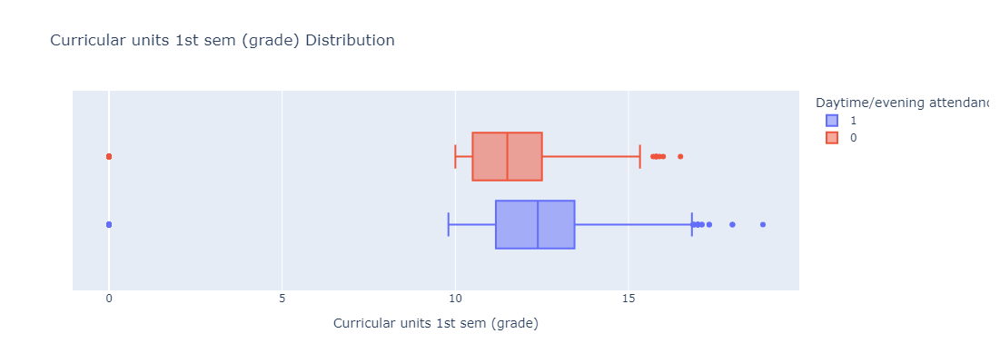

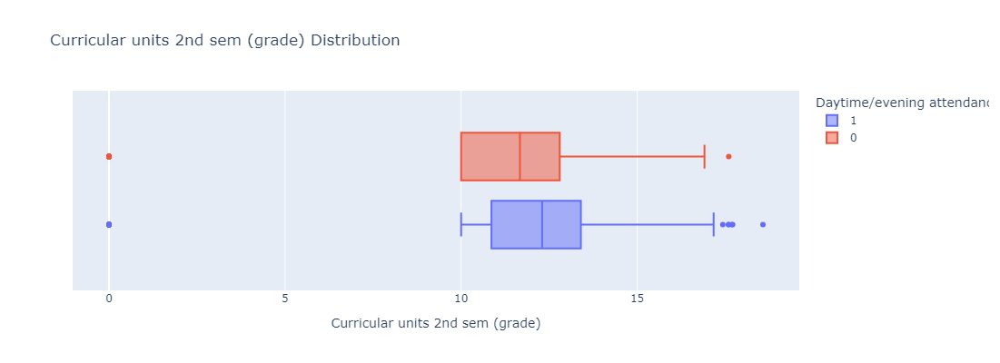

...

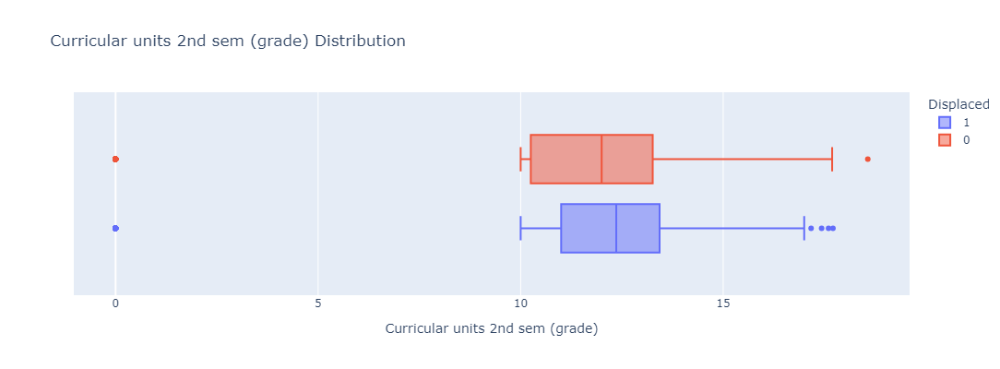

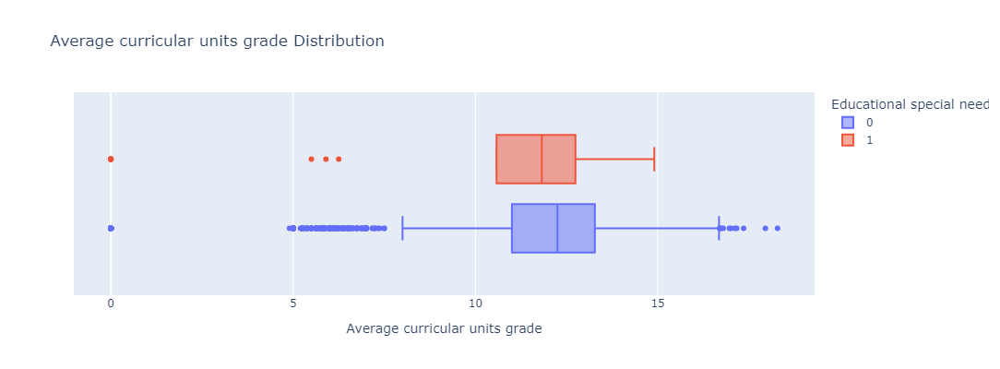

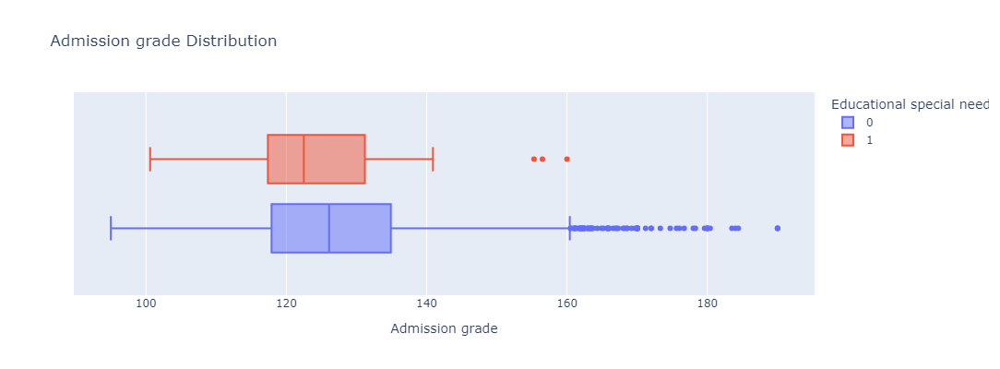

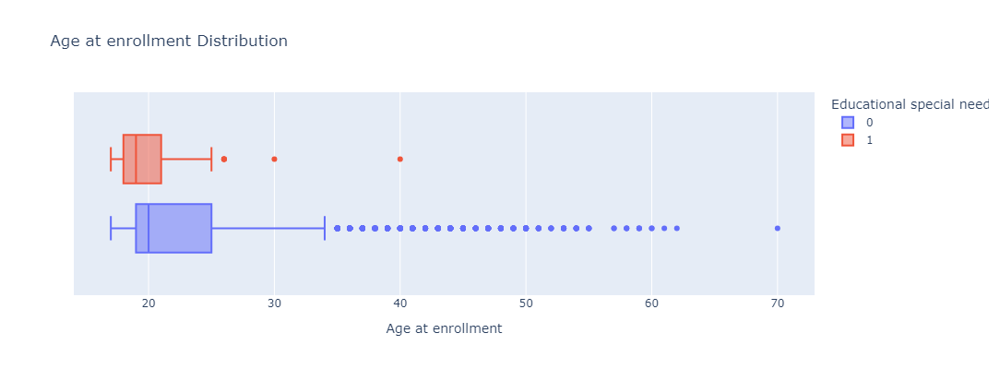

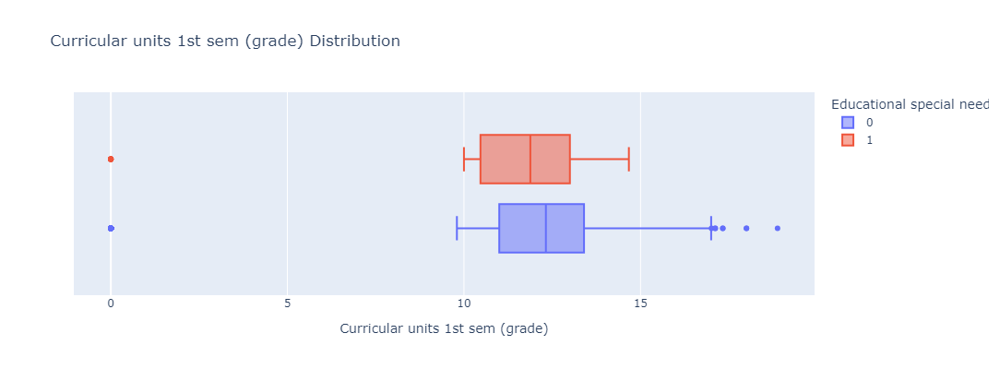

In [ ]:
for cat in category:
    for num in numeric:
        fig = px.box(data, x=num, title= f"{num} Distribution", color=cat,
                     width=600,
                     height=400,)
        fig.show()

In [ ]:
for num in numeric:
    fig = px.box(data, x=num, title= f"{num} Distribution", color='Target',
                 width=600,
                 height=400,)
    fig.show()

##  Perform and visualize correlation analysis

In [ ]:
data[numeric].corr()

In [ ]:
# # Create heatmap using Plotly Express
# fig = px.imshow(data[numeric].corr(),color_continuous_scale="Inferno_r",zmin=-1, zmax=1,text_auto=True, width=600,height=400)
# # Show plot
# fig.show()
all_numeric = ['Average curricular units grade', 'Admission grade','Age at enrollment','Curricular units 1st sem (grade)','Curricular units 2nd sem (grade)','Unemployment rate', 'Inflation rate', 'GDP']
# sns.heatmap(data[all_numeric].corr(), annot=True)
# plt.show()
# Create the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(data[all_numeric].corr(), annot=True, cmap='coolwarm', cbar=True)
plt.title('Heatmap Example')
plt.show()

## Conduct chi-square tests for categorical variables

Ho: Target categories and Tuition fees up to date are independent\
Ha: Target categories and Tuition fees up to date are not independent

In [ ]:
data['Target'].value_counts()

In [ ]:
props = data.groupby('Tuition fees up to date')['Target'].value_counts(normalize=True)
wide_props = props.unstack()
wide_props.plot(kind='bar',stacked=True)

In [ ]:
alpha = 0.1
expected, observed, stats = pingouin.chi2_independence(data=data, x='Tuition fees up to date',y='Target')
print(stats[stats['test']=='pearson'])

The p-value is less than 0.1 so we reject the null hypothesis and conclude that the target categories and the Tuition fees up to date are not independent

In [ ]:
fig = px.histogram(data, x='Target', title= f"{num} Distribution",  nbins=50,color='Tuition fees up to date',
  width=600,
  height=400,)
fig.show()

In [ ]:
data['Course'].value_counts()

In [ ]:
props = data.groupby('Course')['Target'].value_counts(normalize=True)
wide_props = props.unstack()
wide_props
wide_props.plot(kind='bar',stacked=True)

 ## Multivariate Analysis

In [ ]:
# Create pair plots (scatter matrix)
sns.pairplot(data=data[category], hue='Target')
plt.show()

In [ ]:
# Create pair plots (scatter matrix)
sns.pairplot(data=data[all_numeric], hue='Target')
plt.show()